# DSI Instructor Interview Challenge
## Anna Wolak

## Part 1: Modeling Challenge

### Data Context

We've been given a data set that includes measurements of breast cancer cells. Our challenge is to predict whether these cells are benign (B) or malignant (M). The features of the cells are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.

This problem lends itself well to several classification models, such as decision trees, logistic regression, and k-nearest neighbors. For now, we can use accuracy (instead of precision) as our metric for determining whether or not a model is successful.

### Data Sanity Checks

We can't build good models with poor data! Let's start by making sure our data is clean and sensible. Some factors to look out for include:
* What is the shape of our data?
* Is there anything wrong with it? (missing values?)
* Does it make sense to keep all of the data?

In [95]:
import pandas as pd
pd.set_option('display.max_columns', None)

# Load data
header = open('field_names.txt').read().split('\n')
df = pd.read_csv('breast-cancer.csv', names=header)

In [2]:
df.head(5)

,ID,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
df.shape

(569, 32)

In [13]:
df.dtypes

ID                              int64
diagnosis                      object
radius_mean                   float64
radius_sd_error               float64
radius_worst                  float64
texture_mean                  float64
texture_sd_error              float64
texture_worst                 float64
perimeter_mean                float64
perimeter_sd_error            float64
perimeter_worst               float64
area_mean                     float64
area_sd_error                 float64
area_worst                    float64
smoothness_mean               float64
smoothness_sd_error           float64
smoothness_worst              float64
compactness_mean              float64
compactness_sd_error          float64
compactness_worst             float64
concavity_mean                float64
concavity_sd_error            float64
concavity_worst               float64
concave_points_mean           float64
concave_points_sd_error       float64
concave_points_worst          float64
symmetry_mea

In [15]:
df.isnull().values.any()

False

Good news!

We don't have any missing data, and since our features (except for diagnosis and ID) are all continuous floats, we don't need to do any further cleaning.

On the other hand, the ID feature (an int) is unlikely to give us useful information, since it was likely used as an identifier when the data was collected. Let's drop it from our dataframe.

In [16]:
df = df.drop('ID', 1)
df.head()

,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


What else can we learn from this data set right off the bat? Let's check for anything interesting in summary statistics, and then figure out how many cells in this sample were labeled as malignant.

In [17]:
df.describe()

,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [19]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [21]:
print (float(212) / (357+212))

0.372583479789


Looks like about 37% of our cells are malignant. 

As for the rest of the summary statistics, it can be tricky to get an intuitive understanding of whether the data is useful if we're unsure what the factors actually mean. For example, what is symmetry_worst vs. symmetry_mean? Looking at the minimum values and seeing 0.000 is somewhat alarming, since that means that could have been a faulty test. Let's briefly check what those particular data rows look like.

In [22]:
df.loc[df['perimeter_mean'] == 0]

,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
101,B,6.981,13.43,43.79,143.5,0.11700,0.07568,0.0,0.0,0.1930,0.07818,0.2241,1.5080,1.553,9.833,0.010190,0.010840,0.0,0.0,0.02659,0.004100,7.930,19.54,50.41,185.2,0.15840,0.12020,0.0,0.0,0.2932,0.09382
140,B,9.738,11.97,61.24,288.5,0.09250,0.04102,0.0,0.0,0.1903,0.06422,0.1988,0.4960,1.218,12.260,0.006040,0.005656,0.0,0.0,0.02277,0.003220,10.620,14.10,66.53,342.9,0.12340,0.07204,0.0,0.0,0.3105,0.08151
174,B,10.660,15.15,67.49,349.6,0.08792,0.04302,0.0,0.0,0.1928,0.05975,0.3309,1.9250,2.155,21.980,0.008713,0.010170,0.0,0.0,0.03265,0.001002,11.540,19.20,73.20,408.3,0.10760,0.06791,0.0,0.0,0.2710,0.06164
175,B,8.671,14.45,54.42,227.2,0.09138,0.04276,0.0,0.0,0.1722,0.06724,0.2204,0.7873,1.435,11.360,0.009172,0.008007,0.0,0.0,0.02711,0.003399,9.262,17.04,58.36,259.2,0.11620,0.07057,0.0,0.0,0.2592,0.07848
192,B,9.720,18.22,60.73,288.1,0.06950,0.02344,0.0,0.0,0.1653,0.06447,0.3539,4.8850,2.230,21.690,0.001713,0.006736,0.0,0.0,0.03799,0.001688,9.968,20.83,62.25,303.8,0.07117,0.02729,0.0,0.0,0.1909,0.06559
314,B,8.597,18.60,54.09,221.2,0.10740,0.05847,0.0,0.0,0.2163,0.07359,0.3368,2.7770,2.222,17.810,0.020750,0.014030,0.0,0.0,0.06146,0.006820,8.952,22.44,56.65,240.1,0.13470,0.07767,0.0,0.0,0.3142,0.08116
391,B,8.734,16.84,55.27,234.3,0.10390,0.07428,0.0,0.0,0.1985,0.07098,0.5169,2.0790,3.167,28.850,0.015820,0.019660,0.0,0.0,0.01865,0.006736,10.170,22.80,64.01,317.0,0.14600,0.13100,0.0,0.0,0.2445,0.08865
473,B,12.270,29.97,77.42,465.4,0.07699,0.03398,0.0,0.0,0.1701,0.05960,0.4455,3.6470,2.884,35.130,0.007339,0.008243,0.0,0.0,0.03141,0.003136,13.450,38.05,85.08,558.9,0.09422,0.05213,0.0,0.0,0.2409,0.06743
538,B,7.729,25.49,47.98,178.8,0.08098,0.04878,0.0,0.0,0.1870,0.07285,0.3777,1.4620,2.492,19.140,0.012660,0.009692,0.0,0.0,0.02882,0.006872,9.077,30.92,57.17,248.0,0.12560,0.08340,0.0,0.0,0.3058,0.09938
550,B,10.860,21.48,68.51,360.5,0.07431,0.04227,0.0,0.0,0.1661,0.05948,0.3163,1.3040,2.115,20.670,0.009579,0.011040,0.0,0.0,0.03004,0.002228,11.660,24.77,74.08,412.3,0.10010,0.07348,0.0,0.0,0.2458,0.06592


In [26]:
len(df.loc[df['perimeter_mean'] == 0])

13

Interesting! Looks like 13 of our data rows (all with a benign diagnosis) have zeroed values in several factors that wouldn't make sense (like perimeter_mean). If we had access to the researchers behind this data, we could ask them to explain some of their domain knowledge and figure out if any of the zeroed factors really do exist. However, since this is such a small segment of the benign labeled data (about 0.3%), let's just drop them. 

In [28]:
df = df[df['perimeter_mean'] != 0]

In [29]:
df.loc[df['perimeter_mean'] == 0]

,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst


In [30]:
df.describe()

,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,area_sd_error,area_worst,smoothness_mean,smoothness_sd_error,smoothness_worst,compactness_mean,compactness_sd_error,compactness_worst,concavity_mean,concavity_sd_error,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
count,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000
mean,14.237565,19.259748,92.736673,663.734712,0.096616,0.105679,0.090876,0.050063,0.181278,0.062746,0.406447,1.192929,2.879694,40.794973,0.006975,0.025842,0.032639,0.012072,0.020314,0.003799,16.407687,25.679388,108.242878,893.412410,0.132824,0.258472,0.278553,0.117286,0.290802,0.084141
std,3.482170,4.246993,24.006362,350.893313,0.013895,0.052643,0.079468,0.038517,0.027446,0.007059,0.279988,0.499531,2.040962,45.908106,0.002925,0.017947,0.030136,0.005969,0.008072,0.002661,4.797695,6.105744,33.337041,569.492912,0.022616,0.156663,0.206803,0.064087,0.062027,0.018130
min,7.691000,9.710000,48.340000,170.400000,0.062510,0.019380,0.000692,0.001852,0.116700,0.049960,0.111500,0.360200,0.757000,6.802000,0.002667,0.002252,0.000692,0.001852,0.007882,0.000895,8.678000,12.020000,54.490000,223.600000,0.081250,0.034320,0.001845,0.008772,0.156500,0.055040
25%,11.760000,16.177500,75.845000,427.750000,0.086665,0.066608,0.030880,0.020895,0.161900,0.057675,0.232375,0.830700,1.605000,17.857500,0.005124,0.013688,0.015620,0.007997,0.015008,0.002249,13.085000,21.160000,84.567500,521.450000,0.117175,0.151175,0.121800,0.065713,0.250900,0.071873
50%,13.455000,18.855000,87.090000,557.650000,0.096035,0.095090,0.064905,0.034840,0.179250,0.061515,0.321750,1.088000,2.295500,24.700000,0.006302,0.020740,0.026245,0.011100,0.018685,0.003159,15.040000,25.445000,98.320000,696.050000,0.131550,0.217000,0.231400,0.101700,0.282450,0.080075
75%,16.040000,21.735000,105.250000,798.050000,0.105400,0.130600,0.132325,0.074842,0.195750,0.066090,0.482725,1.465250,3.387500,45.440000,0.008076,0.032588,0.042563,0.014933,0.022933,0.004559,19.097500,29.547500,126.750000,1106.750000,0.146325,0.341600,0.386200,0.163150,0.318850,0.092095
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,3.568000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Great, no more zeroes! 

### Data Exploration

Now that we can reasonably assume that our data is clean, let's get a better understanding of our data. We want to understand questions like:
* What is the distribution of the data?
* Are there any correlations?
* Do any confounding factors explain these correlations?

First, let's start with a scatterplot matrix for a big picture view.

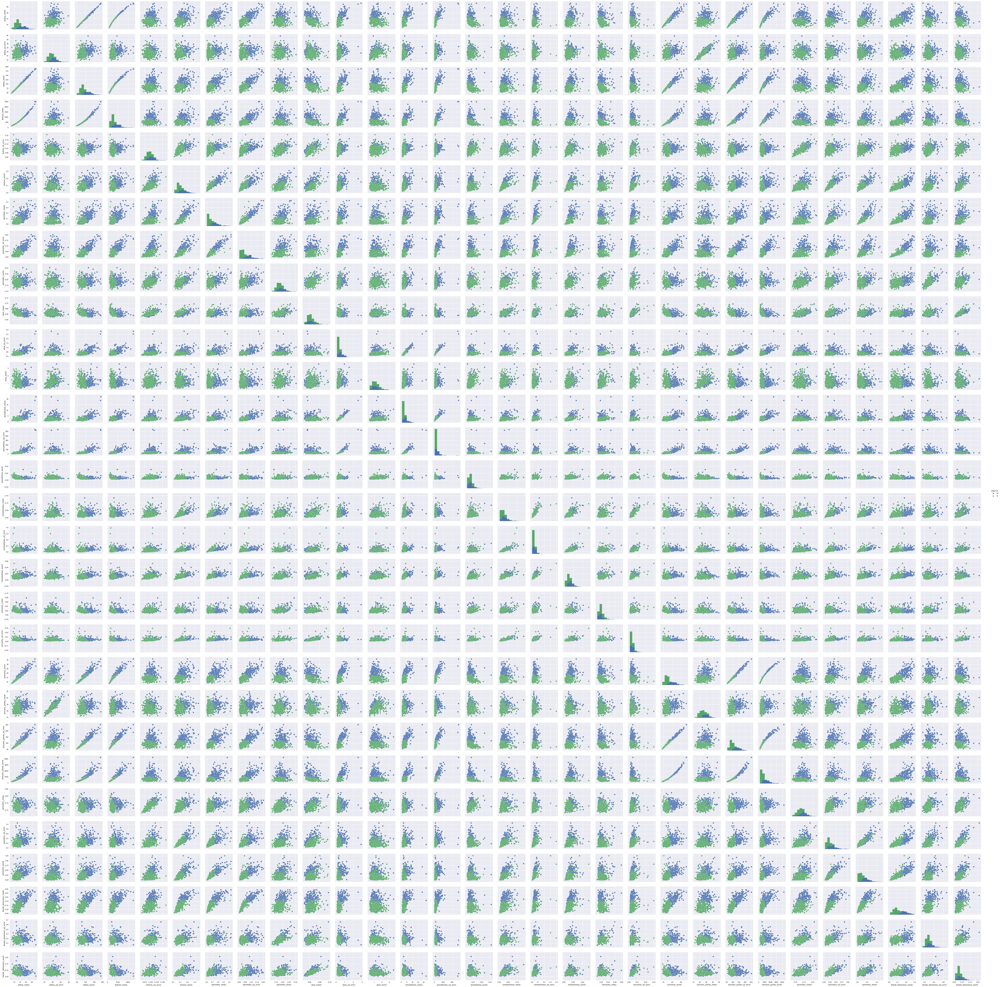

In [35]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

sns.pairplot(df, hue='diagnosis')
plt.show()

Yikes, what a mess! While we're not interested in making perfect visuals right now, it's pretty hard to understand what's happening here since we have so many factors in our data. However, while we have about 30 features, each of those are a version of ten basic factors. Let's create a more simplified dataframe using just the "mean" factors.

In [34]:
df_simple = df[['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 
                'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 
                'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean']]

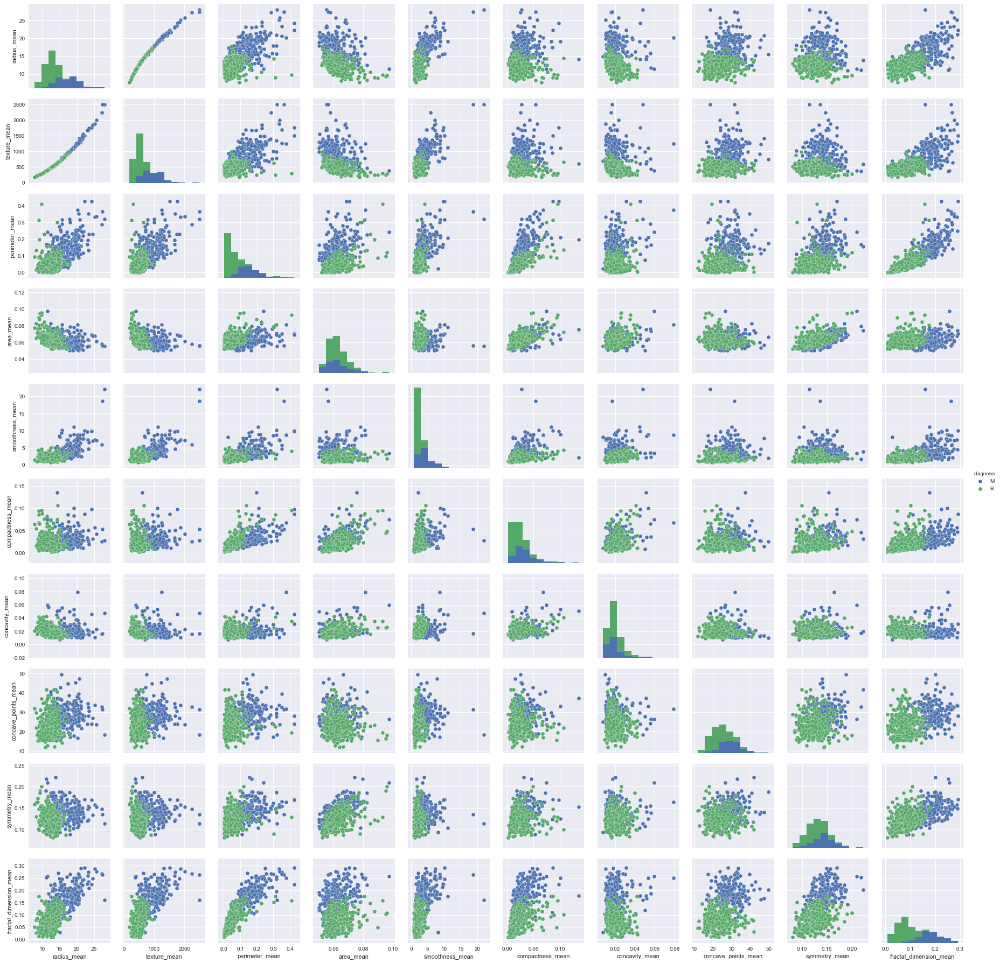

In [36]:
sns.pairplot(df_simple, hue='diagnosis')
plt.show()

Much better! Now that we can actually read our labels, we can make note of some patterns.

__First, what factors are most likely to be predictive of whether a cell is malignant? Looking at the histograms, we will likely have most success with factors where the benign and malignant distributions have minimal overlap. In this case, these factors would include:__
* __fractal_dimension_mean__
* __texture_mean__
* __perimeter_mean__
* __radius_mean__

These factors also happen to be relatively normally distributed. What about other distributions?

It appears that many of our factors have a skewed distribution, which can pose a problem for models that assume a normal distribution. It also means we'll need to be more creative when interpreting our summary statistics (since the means will not equal the median). 

For example, let's take a look at smoothness and compactness for benign and malignant cells. While the histograms have a large amount of overlap, their peaks are quite different. Perhaps we can run a t-test on the benign vs. malignant distributions to see if there's a significant difference. 

But first, how would we calculate the mean and median of these factors?

We can start out by demonstrating the skewness of the data we already have.

In [63]:
aggregation = {
    'smoothness_mean': {
        'mean' : 'mean',
        'median' : 'median'
    },
    'compactness_mean': {
        'mean' : 'mean',
        'median': 'median'
    }
}

df.groupby('diagnosis').agg(aggregation)

compactness_mean           smoothness_mean          
                    median      mean          median      mean
diagnosis                                                     
B                  0.01663  0.021874          1.8280  1.989642
M                  0.02859  0.032281          3.6795  4.323929

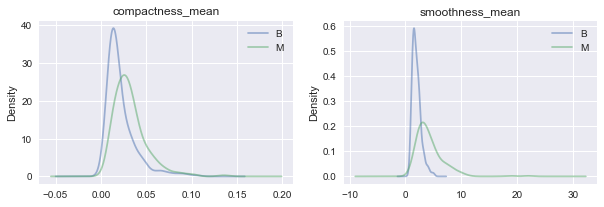

In [58]:
fig, axs = plt.subplots(1,2)
df.groupby('diagnosis').compactness_mean.plot(ax=axs[0], figsize=(10,3), kind='kde', alpha=0.5, title='compactness_mean', legend=True)
df.groupby('diagnosis').smoothness_mean.plot(ax=axs[1], figsize=(10,3), kind='kde', alpha=0.5, title='smoothness_mean', legend=True)
plt.show()

Out of curiosity, let's see how skewed the remaining features are (in the simplified dataframe).

In [62]:
df_simple.skew().sort_values(ascending=False).head(10)

smoothness_mean           3.408764
concavity_mean            2.223363
compactness_mean          1.891095
texture_mean              1.657462
perimeter_mean            1.401938
area_mean                 1.327334
radius_mean               0.979572
fractal_dimension_mean    0.552522
concave_points_mean       0.504021
symmetry_mean             0.450770
dtype: float64

__Let's go back to determining the mean compactness and smoothness for malignant and benign cells. Especially considering that our sample size is relatively small, we can bootstrap by resampling from our data as if it were its own population. The steps of bootstrapping would be:__

* __Take a sample with replacement__
* __Take the mean of that sample, and sample again for x amount of times__
* __Take the mean of the collected means from all samples__

From there, we have a normal distribution of means, and we can perform t-test to determine if there is a difference between malignant and benign means. For a 95% confidence interval, p < 0.05 to reject the null hypothesis (i.e. show a significant difference). 

In [64]:
import numpy as np
import scipy

def bootstrap_sample(df, target_series, num_samples):
    total_means = []
    for n in range(num_samples):
        sample = df.sample(frac=1, replace=True)
        mean = sample[target_series].mean()
        total_means.append(mean)
    total_means = np.array(total_means)
    return total_means

def find_means_and_perform_ttest(total_means_1, total_means_2):
    t_statistic, p_value = scipy.stats.ttest_ind(total_means_1, total_means_2)
    print "t-statistic, p-value: ", t_statistic, p_value
    print "Benign mean: ", np.mean(total_means_benign)
    print "Malignant mean: ", np.mean(total_means_malignant)

Now that we have our function, let's calculate our benign vs. malignant means. 

__Smoothness, malignant vs. benign__

In [66]:
total_means_benign = bootstrap_sample(df[df['diagnosis'] == 'B'], 'smoothness_mean', 5000)
total_means_malignant = bootstrap_sample(df[df['diagnosis'] == 'M'], 'smoothness_mean', 5000)
find_means_and_perform_ttest(total_means_benign, total_means_malignant)

t-statistic, p-value:  -912.158485884 0.0
Benign mean:  1.99023223366
Malignant mean:  4.3284021066


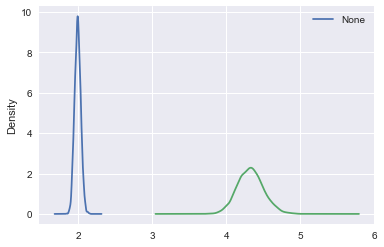

In [72]:
pd.Series(total_means_benign).plot(kind='kde')
pd.Series(total_means_malignant).plot(kind='kde')

__Compactness, maglinant vs. benign__

In [75]:
total_means_benign = bootstrap_sample(df[df['diagnosis'] == 'B'], 'compactness_mean', 5000)
total_means_malignant = bootstrap_sample(df[df['diagnosis'] == 'M'], 'compactness_mean', 5000)
find_means_and_perform_ttest(total_means_benign, total_means_malignant)

t-statistic, p-value:  -478.235981048 0.0
Benign mean:  0.0218849661703
Malignant mean:  0.0322599171415


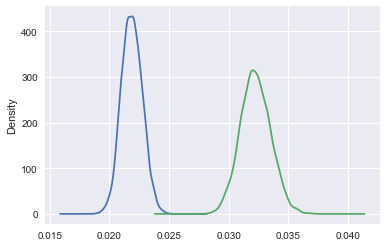

In [76]:
pd.Series(total_means_benign).plot(kind='kde')
pd.Series(total_means_malignant).plot(kind='kde')

As you can see, our p-value is incredibly small (the zero is most likely a rounding error), so we can reject the null hypothesis (that the means of malignant and benign factors are the same) and prove that there is enough difference between the two factors. Note the normal distributions of the means of the means — a neat trick courtesy of the Central Limit Theorem, which makes our means equal to our medians.

### Modeling

Before we throw our data into a model, we need to split it into a training and a testing set. The purpose of modeling is to develop a general enough framework that can be used for new data in the future. If we use all of our data for training, we can't determine how it will behave with new data, nor can we compare between models. We will also likely overfit our data, meaning that the model will make perfectly detailed predictions for your training data, only to flop with new data. 

Typically, we use 80% of the data for training, leaving the remaining 20% untouched for testing.

Inputs are our 30 features, while classes are our benign vs. malignant labels. 

In [96]:
# Convert string 'B' and 'M' labels with binary 'B'=0, 'M'=1
df['diagnosis'] = df['diagnosis'].map( {'B': 0, 'M': 1}).astype(int)

In [97]:
# Convert df to matrices we can use in our machine learning models
all_inputs = df.drop(['diagnosis'], axis=1).values
all_classes = df['diagnosis'].values

Let's check to make sure our matrices look like what we expect.

In [98]:
all_inputs[:2]

array([[  8.42302000e+05,   1.79900000e+01,   1.03800000e+01,
          1.22800000e+02,   1.00100000e+03,   1.18400000e-01,
          2.77600000e-01,   3.00100000e-01,   1.47100000e-01,
          2.41900000e-01,   7.87100000e-02,   1.09500000e+00,
          9.05300000e-01,   8.58900000e+00,   1.53400000e+02,
          6.39900000e-03,   4.90400000e-02,   5.37300000e-02,
          1.58700000e-02,   3.00300000e-02,   6.19300000e-03,
          2.53800000e+01,   1.73300000e+01,   1.84600000e+02,
          2.01900000e+03,   1.62200000e-01,   6.65600000e-01,
          7.11900000e-01,   2.65400000e-01,   4.60100000e-01,
          1.18900000e-01],
       [  8.42517000e+05,   2.05700000e+01,   1.77700000e+01,
          1.32900000e+02,   1.32600000e+03,   8.47400000e-02,
          7.86400000e-02,   8.69000000e-02,   7.01700000e-02,
          1.81200000e-01,   5.66700000e-02,   5.43500000e-01,
          7.33900000e-01,   3.39800000e+00,   7.40800000e+01,
          5.22500000e-03,   1.30800000e-02,

In [99]:
all_classes[:2]

array([1, 1])

Great! Now we're ready to split our data.

In [101]:
from sklearn.model_selection import train_test_split

(training_inputs,
 testing_inputs,
 training_classes,
 testing_classes) = train_test_split(all_inputs, all_classes, train_size=0.8, random_state=1)

And now we can start modeling! 

Let's begin with a __basic decision tree model__, which is a classifier that is easy to understand. Much like a 'choose your own adventure model' or a game of '20 questions', decision trees break down data into a series of yes or no questions all the way to the desired end classes (in our case, benign vs. malignant). 

In [102]:
from sklearn.tree import DecisionTreeClassifier

# Create the classifier
decision_tree_classifier = DecisionTreeClassifier()

# Train the classifier on the training set
decision_tree_classifier.fit(training_inputs, training_classes)

# Validate the classifier on the testing set using classification accuracy
decision_tree_classifier.score(testing_inputs, testing_classes)

0.95614035087719296

Our first pass at this model gave us a whopping 95% accuracy! But we're not finished yet. Depending on how we split our training and testing data, we might have just gotten lucky — and the true accuracy could be much different. 

We can demonstrate this by running this same process (split data, then run classifier on training data) a thousand times, and observe just how different our model accuracy can be.

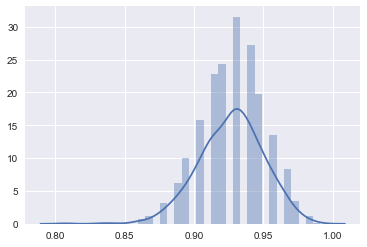

In [103]:
model_accuracies = []

for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(all_inputs, all_classes, train_size=0.8)
    
    decision_tree_classifier = DecisionTreeClassifier()
    decision_tree_classifier.fit(training_inputs, training_classes)
    classifier_accuracy = decision_tree_classifier.score(testing_inputs, testing_classes)
    model_accuracies.append(classifier_accuracy)
    
sns.distplot(model_accuracies)

We can see that the accuracy of our model varied between around 85 - 98%! This is another example of overfitting, which we're trying to avoid so that our model can generalize well enough with new data. 

We can use __k-fold cross validation__ to better determine the accuracy of a model that doesn't overfit. The steps of this validation method are:
* Split the original data into k pieces (k is usually chosen to be 10)
* Leave one of the pieces untouched as testing data
* Use the rest of the k-1 pieces as training data
* Repeat this process k times so that each k piece is only used once

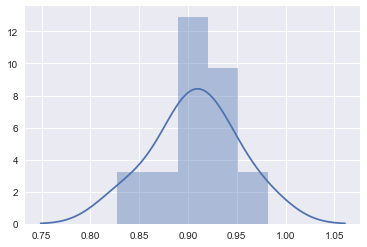

In [111]:
from sklearn.cross_validation import cross_val_score
decision_tree_classifier = DecisionTreeClassifier()

cv_scores = cross_val_score(decision_tree_classifier, all_inputs, all_classes, cv=10)
sns.distplot(cv_scores)

Now you can see that while we still have a bit of variation, the majority of the time, the accuracy of our model most often lands around 90%. 

How else can we improve our model? We can tune it. Since each model has several fitting parameters (in decision trees, one of those parameters is the maximum depth that a tree can have), we can either tweak them by hand, or use Grid Search to automatically test combinations of parameters to determine the best ones. 

Let's try using GridSearch on two decision tree parameters: max_depth and max_features.

In [117]:
from sklearn.model_selection import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

decision_tree_classifier = DecisionTreeClassifier()

parameter_grid = {'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                  'max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}

cross_validation = StratifiedKFold(all_classes, n_folds=10)

grid_search = GridSearchCV(decision_tree_classifier,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs, all_classes)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.95079086116
Best parameters: {'max_features': 9, 'max_depth': 4}


We can visualize how these two parameters interact like this.

/Users/amcyg/datascience/lib/python2.7/site-packages/sklearn/model_selection/_search.py:667: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


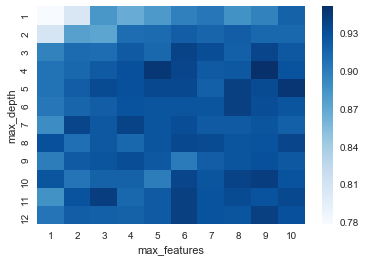

In [127]:
grid_visualization = []

for grid_pair in grid_search.grid_scores_:
    grid_visualization.append(grid_pair.mean_validation_score)
    
grid_visualization = np.array(grid_visualization)
grid_visualization.shape = (12, 10)
sns.heatmap(grid_visualization, cmap='Blues')
plt.xticks(np.arange(10) + 0.5, grid_search.param_grid['max_features'])
plt.yticks(np.arange(12) + 0.5, grid_search.param_grid['max_depth'][::-1])
plt.xlabel('max_features')
plt.ylabel('max_depth')

While the accuracy map seems a bit spread all over the place, the darkest blues are in the zone where max_depth is at least 4, and max_features is at least 8. This matches well with the best parameters found in GridSearch above.

While it's easiest to visualize the GridSearch of only two parameters, the decision tree model has several more. Let's run another GridSearch using all of the remaining parameters.

In [128]:
decision_tree_classifier = DecisionTreeClassifier()

parameter_grid = {'criterion': ['gini', 'entropy'],
                  'splitter': ['best', 'random'],
                  'max_depth': [1, 2, 3, 4, 5],
                  'max_features': [1, 2, 3, 4]}

cross_validation = StratifiedKFold(all_classes, n_folds=10)

grid_search = GridSearchCV(decision_tree_classifier,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs, all_classes)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.945518453427
Best parameters: {'max_features': 4, 'splitter': 'best', 'criterion': 'gini', 'max_depth': 4}


From here, we can plug these parameters into our decision tree model, and evaluate its accuracy.

In [130]:
decision_tree_classifier = grid_search.best_estimator_
decision_tree_classifier

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=4, max_leaf_nodes=None, min_impurity_split=1e-07,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

And we can visualize our decision tree like this.

<img src="cancer_cell_tree.png">

We can also determine the feature importances, which are the most predictive factors, in this decision tree model. You can see in the tree visual above that the fractal_dimension_mean, which has the highest feature importance, is also the top splitting point (node) on the tree. 

This relates well to the visual exploration we did earlier, where we saw that the fractal_dimension_mean had one of the least skewed distributions, and where the histogram had the least amount of overlap between malignant and benign distributions.

In [167]:
features = list(df.columns[1:])
print pd.DataFrame(decision_tree_classifier.feature_importances_, columns = ['Importance'], index=features).sort(['Importance'], ascending = False).head(5)

                         Importance
fractal_dimension_mean     0.747440
concave_points_sd_error    0.123005
radius_sd_error            0.042921
radius_mean                0.030627
fractal_dimension_worst    0.027306


/Users/amcyg/datascience/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


Another model we could use to classify our cancer cell data is the __random forest__. One main disadvantage that the basic decision tree model has is that it's easy for a single tree to overfit the training data. And yet, there are distinct advantages to trees, such as the fact that we don't have to assume that the data is linear (unlike linear regression and other ordinary least squares algorithms) and that they're easy to interpret. 

Random forests are a type of ensemble model of decision trees. Instead of building a single tree using the entire dataset with every feature, in random forests only a fraction of the features are selected (randomly, with replacement) to train. A decision tree is then built from this subset of features, and the process is repeated. In this way, many trees are built in a slightly more generalized way — yet put together, they can be accurate without overfitting.

Again, we can build a cross-validated random forest model with optimized parameters using GridSearch. 

In [172]:
from sklearn.ensemble import RandomForestClassifier

random_forest_classifier = RandomForestClassifier()
random_forest_classifier.fit(training_inputs, training_classes)

parameter_grid = {'n_estimators': [5, 10, 25, 50],
                  'criterion': ['gini', 'entropy'],
                  'max_features': [1, 2, 3, 4],
                  'warm_start': [True, False]}

cross_validation = StratifiedKFold(all_classes, n_folds=10)

grid_search = GridSearchCV(random_forest_classifier,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs, all_classes)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

grid_search.best_estimator_

Best score: 0.966608084359
Best parameters: {'max_features': 2, 'n_estimators': 50, 'criterion': 'gini', 'warm_start': True}


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=2, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=50, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=True)

You can see here that while our basic decision tree had fairly high accuracy at approximately 94.6%, the random forest model was even more accurate at approximately 97.2%. 

In [173]:
print pd.DataFrame(random_forest_classifier.feature_importances_, columns = ['Importance'], index=features).sort(['Importance'], ascending = False).head(5)

                         Importance
concave_points_sd_error    0.298925
perimeter_sd_error         0.285199
concave_points_worst       0.095090
radius_mean                0.064861
fractal_dimension_mean     0.052379


/Users/amcyg/datascience/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


Interestingly enough, the feature importances change in the random forest model. While the fractal_dimension_mean is still within the top five, the concave_points_sd_error and perimeter_sd_error factors were more predictive. 

The importances are also more evenly distributed among all factors, instead of heavily weighted on the top feature. This is likely related to the way that random forests are built, and plays a role in preventing the overfitting issues found in basic decision trees.

### Future work

Trees and random forests are just the beginning of the classification modeling options. Given more time, I would explore other models, such as logistic regression, k-nearest neighbors, and support vector machines. 

Given the high number of features in this data set — including quite a few that correlate to one another — I would look into dimensionality reduction techniques, such as principal components analysis. 

Finally, assuming this model was to be eventually used for a cancer diagnostic test, I would create a confusion matrix and a ROC curve for all tested models to determine which model has the right balance of sensitivity and specificity. 

## Part 2: Grading Challenge

In [174]:
df = pd.read_csv('part-2-data.train.csv')

In [187]:
df.head(2)

,Id,Title,FullDescription,LocationRaw,LocationNormalized,ContractType,ContractTime,Company,Category,SalaryRaw,SalaryNormalized,SourceName
0,12612628,Engineering Systems Analyst,Engineering Systems Analyst Dorking Surrey Sal...,"Dorking, Surrey, Surrey",Dorking,NaN,permanent,Gregory Martin International,Engineering Jobs,20000 - 30000/annum 20-30K,25000,cv-library.co.uk
1,12612830,Stress Engineer Glasgow,Stress Engineer Glasgow Salary **** to **** We...,"Glasgow, Scotland, Scotland",Glasgow,NaN,permanent,Gregory Martin International,Engineering Jobs,25000 - 35000/annum 25-35K,30000,cv-library.co.uk


### Student Sample 1

In [221]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import train_test_split

# Load data
d = pd.read_csv('part-2-data.train.csv')


# Setup data for prediction
X = data.SalaryNormalized.values 
X = X.reshape(-1,1) # One dimensional arrays need to be reshaped - check deprecation notifications for hints
y = pd.get_dummies(data.ContractType).values

# Setup model
model = LinearRegression()

# Evaluate model
scores = cross_val_score(model, X, y, cv=2, scoring='neg_mean_absolute_error') # mean_absolute_error will soon be renamed
print(scores.mean())

-0.269701341386


#### Code
* The LinearRegression model "lives" under sklearn.linear_model, not directly under sklearn
* Generally the convention for a new dataframe is 'df', not 'd'. However, you can technically use whatever term you'd like (sometimes it's helpful to use names such as 'df_clean' to keep dataframes separate and organized). Just make sure to stay consistent throughout (you tried to reference your X array as data.column_name, instead of d.column_name). 
* This can also be personal preference, but when you have your entire pipeline in one python file (or Jupyter cell), it's a good idea to keep your dependencies together at the top of your file. If you're exploring a dataset for the first time in a Jupyter notebook, it's fine if you prefer to import dependencies as you go. 
* Dependencies also only need to be called once before you first use it.

#### Methodology
* Remember that you must convert your dataframe sections into numpy arrays in order for them to be useable in sklearn ML algorithms. 
* Don't forget to split your data into test and train sections. 

#### Conceptual Understanding
* What more can you say about the score you calculated at the end? Why is it useful to you?

### Student Sample 2

In [214]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import cross_val_score

# Load data
data = pd.read_csv('part-2-data.train.csv')


# Setup data for prediction
X = data.SalaryNormalized.values
X = X.reshape(-1,1) # when passing 1D arrays, you need to reshape your data to avoid an error
y = pd.get_dummies(data.ContractType).values # don't forget .values to create a matrix

# Split test / train data
(X_train,
 X_test,
 y_train,
 y_test) = train_test_split(X, y, train_size=0.8, random_state=1)


# Setup model
model = LinearRegression()

# Evaluate model
scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error')
print(scores.mean())

-0.267786656491


#### Code
* Great organization of your import libraries right up top :) 
* Generally, you want to label your inputs (features) as X, and your classes (labels) as y. 
* When dealing with one dimensional arrays, be sure to reshape them - see error messages for clues on what is needed.
* Don't forget to split your data into testing and training sets
* mean_absolute_error scoring is being deprecated and replaced with neg_mean_absolute_error

#### Methodology
* Remember that you are converting parts of your dataframe into numpy arrays that are readable by sklearn ML algorithms - this is why you need to add .values when selecting your inputs and classes. 

#### Conceptual Understanding
* What more can you say about the result that you got? Why is it useful to you?